In [10]:
import seml
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [11]:
results = seml.get_results('alexnet-int', to_data_frame=True)

  0%|          | 0/102 [00:00<?, ?it/s]

  0%|          | 0/102 [00:00<?, ?it/s]

/nfs/homedirs/ayle/miniconda3/envs/gr/lib/python3.8/site-packages/seml/evaluation.py:80: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  parsed = pd.io.json.json_normalize(parsed, sep='.')


In [12]:
result_cols = [col for col in results.columns if col.startswith("result")]

In [13]:
results['result.lip_spec']

def get_int(tensor):
    return tensor if type(tensor) == float else tensor.item()

results['result.lip_spec'] = results['result.lip_spec'].apply(get_int)

In [14]:
results = results.groupby(['config.arguments.train_scheme', 
                           'config.arguments.prune_criterion', 
                           'config.arguments.pruning_limit',
                           'config.arguments.data_set',
#                            'config.arguments.batch_size',
#                           'config.arguments.seed'
                          ])[
    result_cols
].agg('mean')

In [15]:
results

result.train_acc  \
config.arguments.train_scheme config.arguments.prune_criterion config.arguments.pruning_limit config.arguments.data_set                     
DefaultTrainer                EarlyJohn                        0.50                           CIFAR10                            0.963281   
                                                               0.75                           CIFAR10                            0.959766   
                                                               0.90                           CIFAR10                            0.952734   
                                                               0.95                           CIFAR10                            0.953516   
                              EmptyCrit                        0.00                           CIFAR10                            0.959766   
                              GRASP                            0.50                           CIFAR10                            0.966797   
                                                               0.75                           CIFAR10                            0.969141   
                                                               0.90                           CIFAR10                            0.960156   
                                                               0.95                           CIFAR10                            0.958984   
                              IMP                              0.50                           CIFAR10                            0.951953   
                                                               0.75                           CIFAR10                            0.959766   
                                                               0.90                           CIFAR10                            0.948438   
                                                               0.95                           CIFAR10                            0.957422   
                              SNIPit                           0.50                           CIFAR10                            0.957520   
                                                               0.75                           CIFAR10                            0.960449   
                                                               0.90                           CIFAR10                            0.960938   
                                                               0.95                           CIFAR10                            0.951823   
                              StructuredEFGit                  0.50                           CIFAR10                            0.947266   
                                                               0.75                           CIFAR10                            0.937109   
                                                               0.90                           CIFAR10                            0.905078   
                                                               0.95                           CIFAR10                            0.799805   
                              Synflow                          0.50                           CIFAR10                            0.957031   
                                                               0.75                           CIFAR10                            0.964844   
                                                               0.90                           CIFAR10                            0.961914   
                                                               0.95                           CIFAR10                            0.968750   

                                                                                                                         result.test_acc  \
config.arguments.train_scheme config.arguments.prune_criterion config.arguments.pruning_limit config.arguments.data_set                    
DefaultTrainer                Ear

In [16]:
results = results.reset_index()

In [17]:
criterions = np.delete(np.unique(results["config.arguments.prune_criterion"]), np.where(np.unique(results["config.arguments.prune_criterion"]) == "EmptyCrit"))

In [18]:
criterions = ['GRASP', 'SNIPit', 'EarlyJohn', 'IMP']
names = ['GRASP (Before)', 'SNIPit (Before)', 'Early-CROP (Early)', 'IMP (Rewinding)']

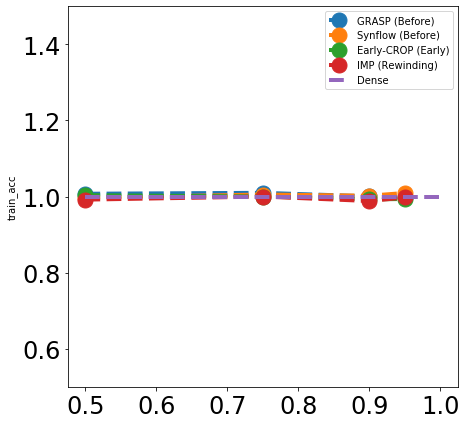

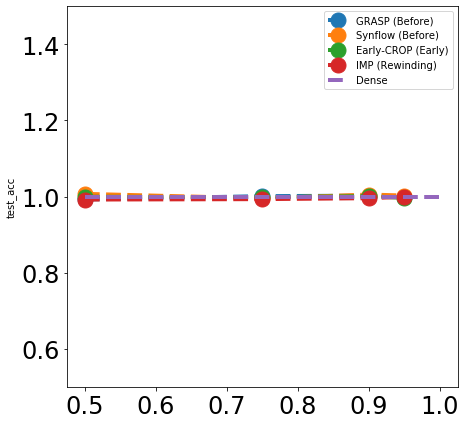

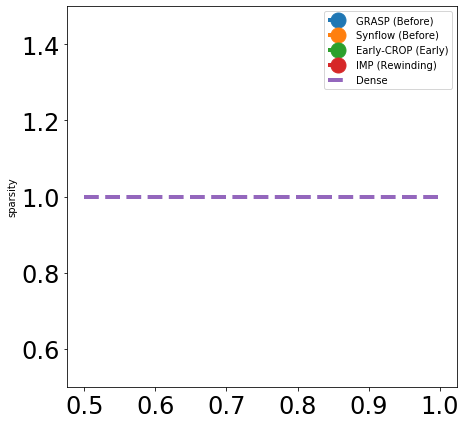

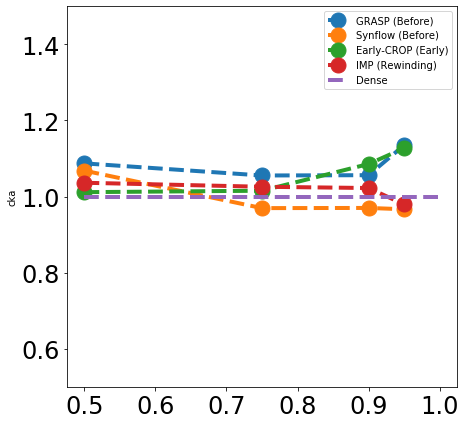

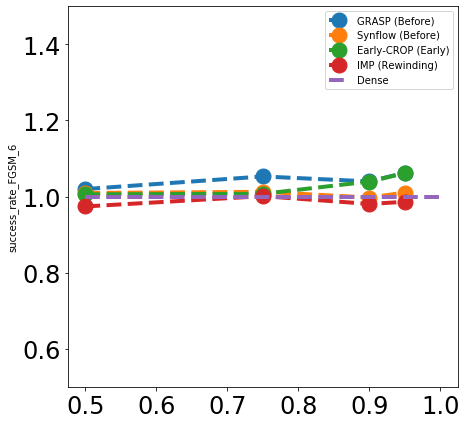

...

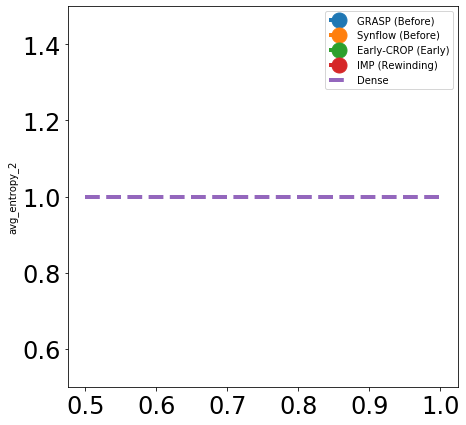

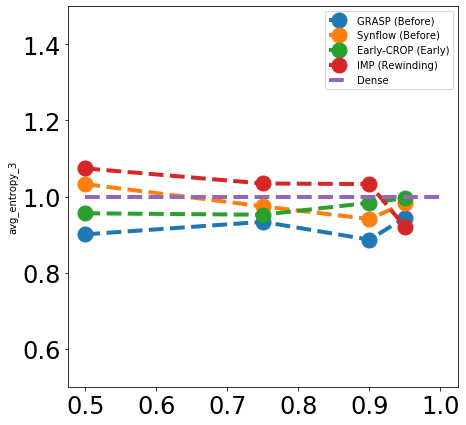

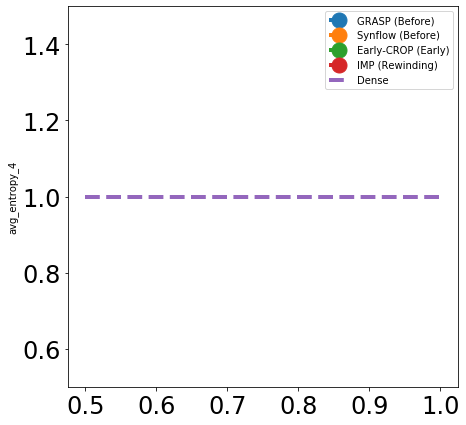

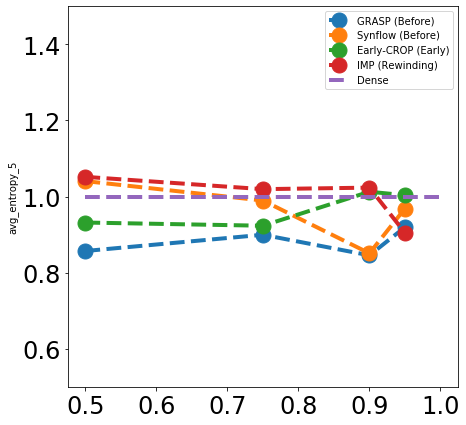

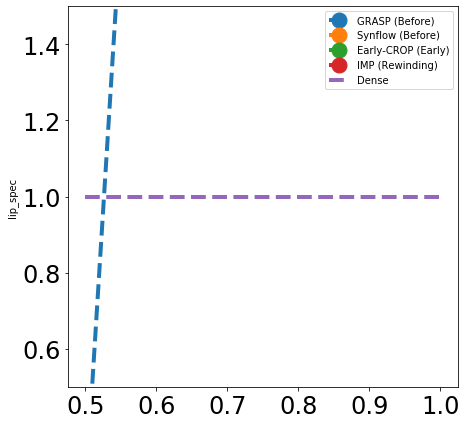

In [19]:
for col in results.columns:
    if col.startswith("result"):
#         if col.split('.')[-1].startswith('auroc_KMNIST'):
        dense = results[results["config.arguments.prune_criterion"] == 'EmptyCrit']
#         plt.figure(figsize=(15, 15))
        plt.figure(figsize=(7, 7))
        for i, crit in enumerate(criterions):
            subset = results[results["config.arguments.prune_criterion"] == crit]
            plt.plot(subset["config.arguments.pruning_limit"], subset[col] / dense[col].iloc[0], linestyle='--', marker='o', label=names[i], linewidth=4, markersize=15)
        plt.plot(np.linspace(0.5, 1, 200), [1] * 200, label='Dense', linestyle='--', linewidth=4)
#         plt.xlabel("Sparsity", fontsize=24)
        plt.ylabel(col.split('.')[-1])
#         plt.ylabel('Adversarial Success (FGSM \u03B5=6)', fontsize=24)
        plt.ylim(0.5, 1.5)
#         plt.legend(fontsize=32, loc='upper center', ncol=5, bbox_to_anchor=(1, -2))
        plt.legend()
        plt.xticks(fontsize=24)
        plt.yticks(fontsize=24)
        plt.show()